This notebook contains my experiments with some images where I note observations with different features and scalings.

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import platform
import pickle
import get_data as gd
import get_features as gf

plt.rcParams.update({'font.size': 12})
plt.rcParams.update({'text.color': "white"})
plt.rcParams['figure.figsize'] = [24, 8]
plt.rcParams['axes.facecolor'] = 'black'

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')

Import part of the data set

In [2]:
from skimage import io, filters, color, transform
startData, startLabels = gd.load_CIFAR_batch("cifar-10-batches-py/data_batch_1")

# Take sample of images
sampleLen = 20
sampleSet = np.full((sampleLen, 32, 32, 3), 0)
sampleLabels = np.empty(sampleLen, dtype = object)
for i in range(len(sampleSet)):
    sampleSet[i] = gf.toImage(startData[i])
    sampleLabels[i] = classes[startLabels[i]]

Plot original, gray scale, RGB, and HSV data

Text(0.5, 0.98, 'Different image representations')

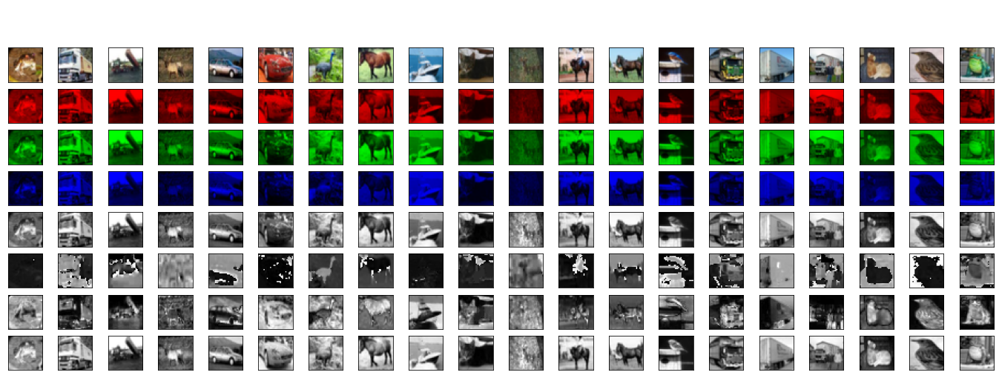

In [3]:
fig, ax = plt.subplots(8, sampleLen)
for i, axi in enumerate(ax.flat):
    image = sampleSet[i % sampleLen]

    if i < sampleLen:      
        axi.imshow(image)
        axi.set(title = sampleLabels[i % sampleLen])

    elif i < sampleLen * 2:
        temp = np.zeros(image.shape, dtype = int)
        temp[:,:,0], g, b = gf.toComps(image)
        axi.imshow(temp)

    elif i < sampleLen * 3:
        temp = np.zeros(image.shape, dtype = int)
        r, temp[:,:,1], b = gf.toComps(image)
        axi.imshow(temp)

    elif i < sampleLen * 4:
        temp = np.zeros(image.shape, dtype = int)
        r, g, temp[:,:,2] = gf.toComps(image)
        axi.imshow(temp)

    elif i < sampleLen * 5:   
        axi.imshow(color.rgb2grey(image), cmap = "gray")

    elif i < sampleLen * 6:  
        image = color.rgb2hsv(image)
        h, s, v = gf.toComps(image)
        axi.imshow(h, cmap = "gray")

    elif i < sampleLen * 7:   
        image = color.rgb2hsv(image)
        h, s, v = gf.toComps(image)
        axi.imshow(s, cmap = "gray")

    elif i < sampleLen * 8:   
        image = color.rgb2hsv(image)
        h, s, v = gf.toComps(image)
        axi.imshow(v, cmap = "gray")

    axi.set(xticks = [], yticks = [])

fig.suptitle("Different image representations")

The RGB pixels do not seem to be very different from each other.  Or at least they are not that apparent to the human eye.  Moving further down to the grayscale and HSV values, I see that each channel appears to have more distinct information about the image than the RGB images.  Moving forward, I think I will use the HSV and grayscale data with further feature extraction.  Because I will focus on GHSV data, I will make a function to make plotting them easier.

In [4]:
def plot_ghsv_function(images, labels, transform, transformName, colors):
    numIm = images.shape[0]
    fig, ax = plt.subplots(5, numIm)
    for i, axi in enumerate(ax.flat):
        image = images[i % numIm]
        grey = color.rgb2grey(image)
        hsv = color.rgb2hsv(image)
        h, s, v = gf.toComps(hsv)

        if i < numIm:
            axi.imshow(image)
            axi.set(title=labels[i % numIm])

        elif i < numIm * 2:
            grey = transform(grey)
            axi.imshow(grey, cmap=colors)

        elif i < numIm * 3:
            h = transform(h)
            axi.imshow(h, cmap=colors)

        elif i < numIm * 4:
            s = transform(s)
            axi.imshow(s, cmap=colors)

        elif i < numIm * 5:
            v = transform(v)
            axi.imshow(v, cmap=colors)

        axi.set(xticks = [], yticks =[])
    
    fig.suptitle(transformName)

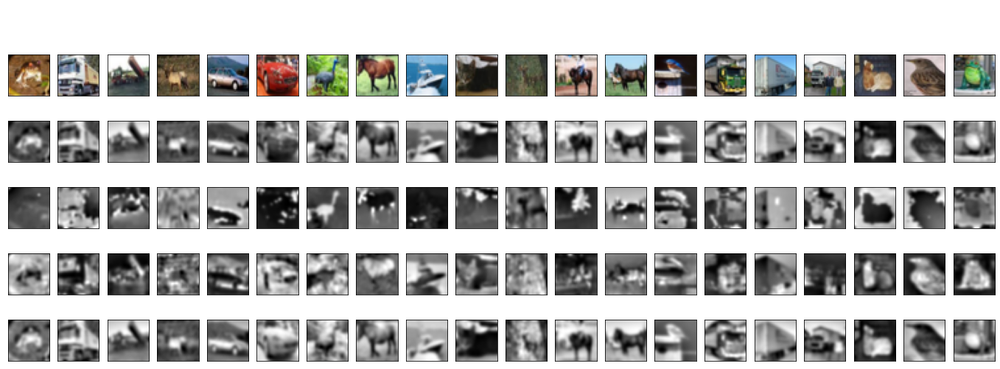

In [5]:
from skimage import io, filters, color, transform
from scipy.fftpack import fftn, fftshift

def gauss(channel):
    return filters.difference_of_gaussians(channel, 1, 12)

plot_ghsv_function(sampleSet, sampleLabels, gauss, "Gaussian Difference", 'gray')

This filter makes the objects blurrier, which I think can be useful for other preprocessing, but I think a Gaussian difference filter on its own does not provide any useful data.

In [6]:
plot_ghsv_function(sampleSet, sampleLabels, filters.sobel, "Sobel Edges", 'gray')

I read that the Sobel filter can expose the edges that exist inside an image.  As I see above, I can make out the general shape of the objects in the images from each channel.  The hue channel seems to give the most dramatic outlines or almost no useful outlines at all.  The saturation channel appears to do better than this.  It seems to be tied with the value channel.  The saturation channel seems to have more noise in the images, but I think it is because the Sobel filter is catching the textures that exist inside the images.  I think later, a Sobel mixed with an FFT could be an interesting outcome, especially with some texture information from the saturation channel.  I think since the value channel has higher fidelity to outlines typically, it might be better to use with an HOG like we saw in the example notebooks.

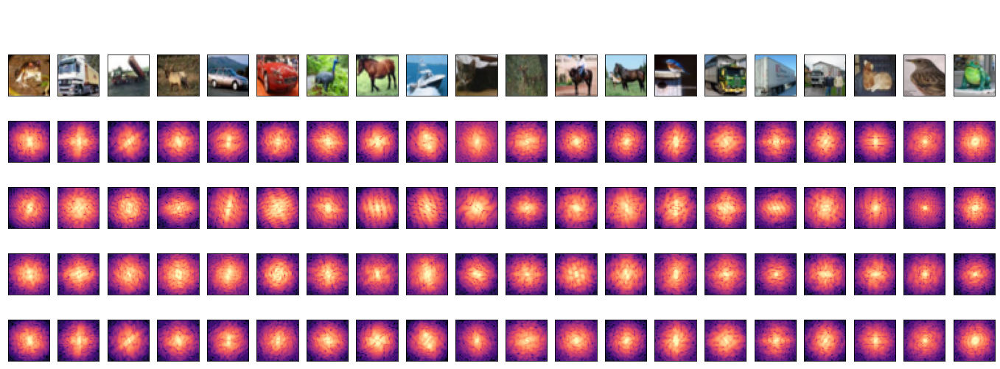

In [7]:
plot_ghsv_function(sampleSet, sampleLabels, gf.FFT, "Gauss Dif Filter, Hanning Window, and logFFT", 'magma')

These images are interesting, and what they tell me about the image is not obvious at first.  I think given the size of the images and the nature of the objects might not make the FFT that useful on its own.  I see that more geometric objects possess lower frequency components while textured photos tend to have a lot of higher frequency components.  Maybe if we perform a Gaussian filter that cuts our lower frequency contents, we could better differentiate the blockier classes like cars from animals.  However, within those two super classes, I do not see this being that useful.  High frequency components probably would not tell us enough information to judge a bird between a cat for instance.  I think that giving lower frequencies and higher frequencies their own channels might be useful and require less features overall upon PCA.  There is more area around the edges to check for higher frequency content.  I think adding two channels where we shift the FFT to the center will help with lower frequencies and blocky classifications, whereas a corner-based FFT would give us a nice chunk in the middle of the FFT image to analyze higher frequency contents like textures with less features overall.

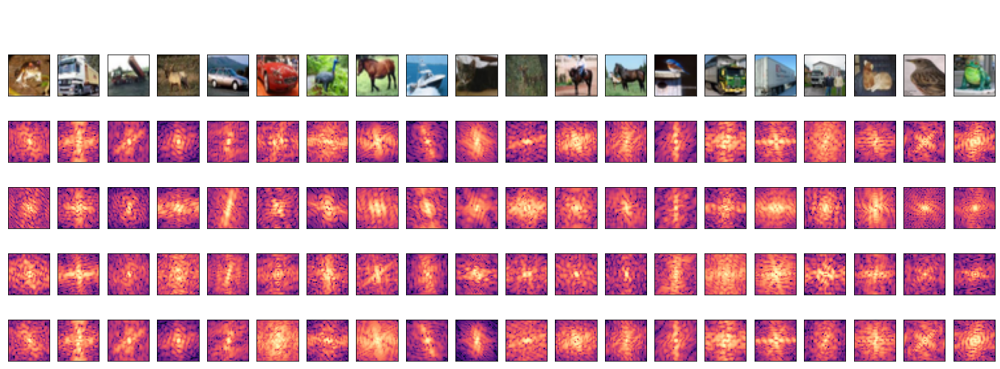

In [8]:
plot_ghsv_function(sampleSet, sampleLabels, gf.SOBEL_FFT, "Sobel then FFT", 'magma')

I think the effect of this combination is that I have gotten rid of some higher frequency content and blurred the lower frequencies more.  I do not suspect this would be a useful feature set.  It makes sense though.  They just look like FFTs with a more aggressive Gaussian filter.

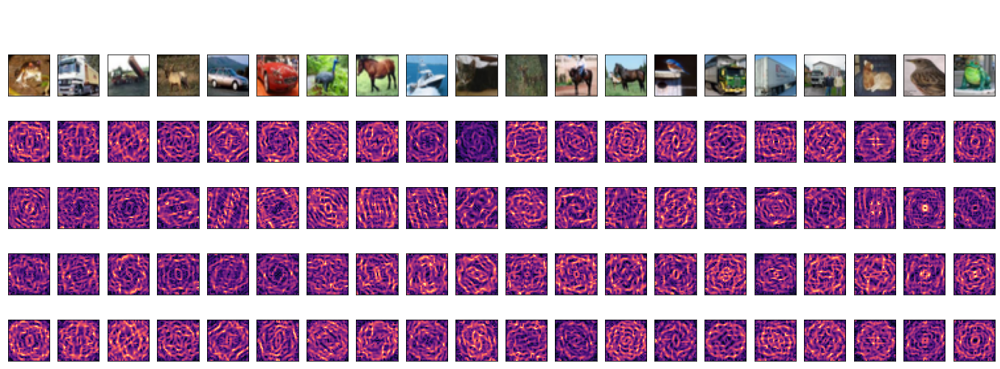

In [9]:
plot_ghsv_function(sampleSet, sampleLabels, gf.FFT_SOBEL, "FFT then Sobel", 'magma')

These images are very interesting to look at, but I am unsure if they would be useful necessarily.  I notice a pattern in these feature sets where the blockier the image, the more interesting blocky geometry in the center.  Before I began experimenting with features, I tested an SVM model with just RGB data, and it struggled with trucks, cars, ships, and planes.  Maybe these features can easily expose some patterns in the FFTs and make the geometry more discernable from a car or truck and the like.  I feel that upon PCA, these images will carry a lot of redundancy, but the center 8 X 8 grid of pixels would probbaly stay and potentially offer a classification advantage in some situations.  I will keep this image set in the back of my mind.This ThiThis

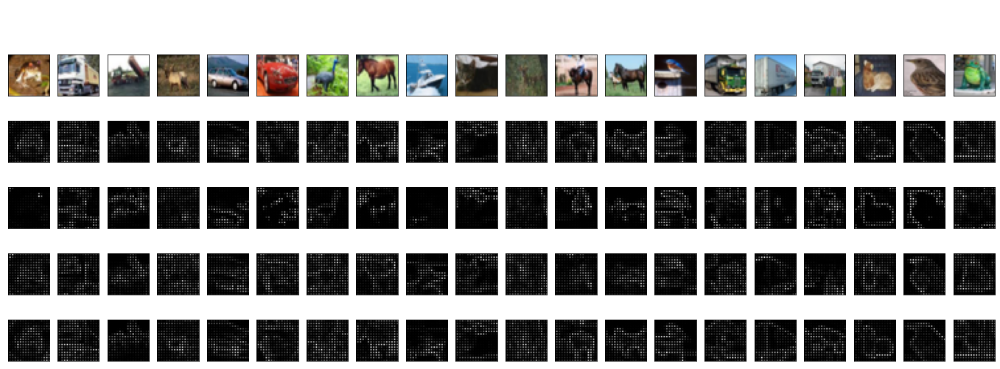

In [10]:
from skimage.feature import hog
from skimage import exposure

def myHog(channel):
    fd, image = hog(channel, orientations=8, pixels_per_cell=(2, 2),
                    cells_per_block=(1, 1), visualize=True, feature_vector = True)
    return image

plot_ghsv_function(sampleSet, sampleLabels, myHog, "HOG", 'gray')

The HOG features are nice approximates of the original images.  I think I will use this instead of RGB or grey values.  I will need to augment them with the spectral information as well.

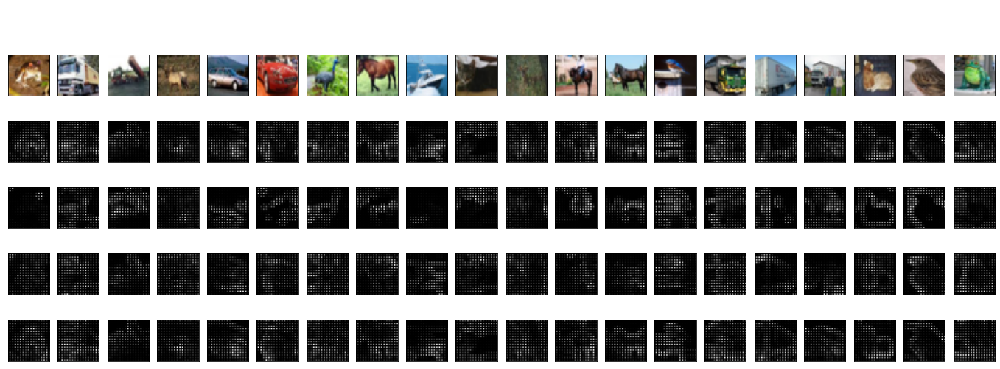

In [11]:
def mySobelHog(channel):
    sob = filters.sobel(channel)
    _, image = hog(sob, orientations=8, pixels_per_cell=(2, 2),
                    cells_per_block=(1, 1), visualize=True, feature_vector = True)
    return image

plot_ghsv_function(sampleSet, sampleLabels, mySobelHog, "Sobel then HOG", 'gray')

Against my expectations, the Sobel filter does not seem to help refine the HOG.  The shapes of the objects have been distorted to be thicker and additional background data is more present.

Final Features

For the rest of this assignment, I will be using the following features:
- HOG
- FFT
- Grayscale
- Sobel

I am leaving out the RGB data because on my initial run, those features did not give me a good accuracy at all.  I think that if I leave them out and work with extracted feature sets, I can have better accuracy.  The HOG and Grayscale data offer much of the same information as the RGB data.  I figure that this will condense the training process.  In my mind, I thought that since the RGB channels and Grayscale channel can be converted between each other, that would indicate that the RGB channels are redundant information, like how some matrices have linear combinations of itself present as rows or columns.  The FFT data adds an additional layer of shapes and textures to analyze in another domain.  I said something before about splitting the FFTs into high and low frequency channels, but I think that would be too many features to train over.  Finally, the Sobel features will reveal additional shape information.